# Version Control

In [ ]:
"""
Python: 3.10.8 
os: nt
pandas: 2.2.3
seaborn: 0.13.2
numpy: 1.26.4
sklearn: 1.5.2
imblearn: 0.12.4
matplotlib: 3.9.2
scipy: 1.14.1
lime: 0.2.0.1
"""

In [52]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
import sklearn
import imblearn
import matplotlib.pyplot as plt
import scipy
import lime
import sys
import pkg_resources  # To get the version of 'lime'

# Dictionary to store library names and versions
libraries = {
    "Python": sys.version,
    "os": os.name,  # os doesn't have a version; this shows the OS type
    "pandas": pd.__version__,
    "seaborn": sns.__version__,
    "numpy": np.__version__,
    "sklearn": sklearn.__version__,
    "imblearn": imblearn.__version__,
    "matplotlib": plt.matplotlib.__version__,
    "scipy": scipy.__version__,
    "lime": pkg_resources.get_distribution("lime").version  # Use pkg_resources for lime
}

# Print the library versions
for lib, version in libraries.items():
    print(f"{lib}: {version}")



Python: 3.10.8 | packaged by conda-forge | (main, Nov 22 2022, 08:16:53) [MSC v.1929 64 bit (AMD64)]
os: nt
pandas: 2.2.3
seaborn: 0.13.2
numpy: 1.26.4
sklearn: 1.5.2
imblearn: 0.12.4
matplotlib: 3.9.2
scipy: 1.14.1
lime: 0.2.0.1


# Data Exploration and Visualization

In [57]:
import os
import pandas as pd

# Path to the main folder containing patient data
root_directory = os.getcwd()
root_directory = os.path.join(root_directory, './LLUI iARAT/Patient_raw_data')

# Initialize counters and storage
patient_ids = []
appointments_per_patient = {}
total_appointments = 0
empty_appointments_count = 0
hidden_folders_count = 0

# Required sensor files for completeness
required_sensors = ["right_wrist.csv", "left_wrist.csv", "right_arm.csv", "left_arm.csv", "chest.csv"]

# Traverse the patient directories
for patient_folder in os.listdir(root_directory):
    patient_path = os.path.join(root_directory, patient_folder)
    if os.path.isdir(patient_path):  # Ensure it's a folder
        patient_ids.append(patient_folder)
        appointment_folders = os.listdir(os.path.join(patient_path, "iARAT"))
        appointments_per_patient[patient_folder] = len(appointment_folders)
        total_appointments += len(appointment_folders)
        
        # Analyze each appointment folder
        for appointment_folder in appointment_folders:
            appointment_path = os.path.join(patient_path, "iARAT", appointment_folder)
            
            # Skip hidden folders and files (like .DS_Store)
            if appointment_folder.startswith('.') or not os.path.isdir(appointment_path):
                hidden_folders_count += 1
                continue
            
            available_files = os.listdir(appointment_path)
            
            # Check if there are any sensor files in the appointment folder
            if not available_files:  # If the folder is empty, consider it as empty appointment
                empty_appointments_count += 1

# Calculate the final statistics
clean_total_appointments = total_appointments - hidden_folders_count
average_appointments_per_patient = clean_total_appointments / len(patient_ids) if len(patient_ids) > 0 else 0
empty_appointments_percentage = (empty_appointments_count / clean_total_appointments) * 100 if clean_total_appointments > 0 else 0

print(f"Total Patients: {len(patient_ids)}")
print(f"Total Appointments (after hidden folder removal): {clean_total_appointments}")
print(f"Average Appointments per Patient: {average_appointments_per_patient:.2f}")
print(f"Hidden Folders Count: {hidden_folders_count}")
print(f"Empty Appointments Count: {empty_appointments_count}")
print(f"Empty Appointments Percentage: {empty_appointments_percentage:.2f}%")

# Display the number of appointments per patient
print("\nAppointments per Patient:")
for patient, count in appointments_per_patient.items():
    print(f"  Patient {patient}: {count} appointments")

Total Patients: 49
Total Appointments (after hidden folder removal): 129
Average Appointments per Patient: 2.63
Hidden Folders Count: 2
Empty Appointments Count: 0
Empty Appointments Percentage: 0.00%

Appointments per Patient:
  Patient 5050359: 1 appointments
  Patient 5050513: 1 appointments
  Patient 5050673: 6 appointments
  Patient 5050739: 3 appointments
  Patient 5050903: 2 appointments
  Patient 5050945: 3 appointments
  Patient 5051002: 2 appointments
  Patient 5051205: 4 appointments
  Patient 5051208: 2 appointments
  Patient 5051573: 1 appointments
  Patient 5051604: 3 appointments
  Patient 5051610: 1 appointments
  Patient 5051632: 2 appointments
  Patient 5051638: 1 appointments
  Patient 5051639: 4 appointments
  Patient 5051661: 2 appointments
  Patient 5051664: 2 appointments
  Patient 5051665: 2 appointments
  Patient 5051671: 2 appointments
  Patient 5051673: 1 appointments
  Patient 5051674: 1 appointments
  Patient 5051679: 3 appointments
  Patient 5051686: 4 app

Task 1
Score: 3


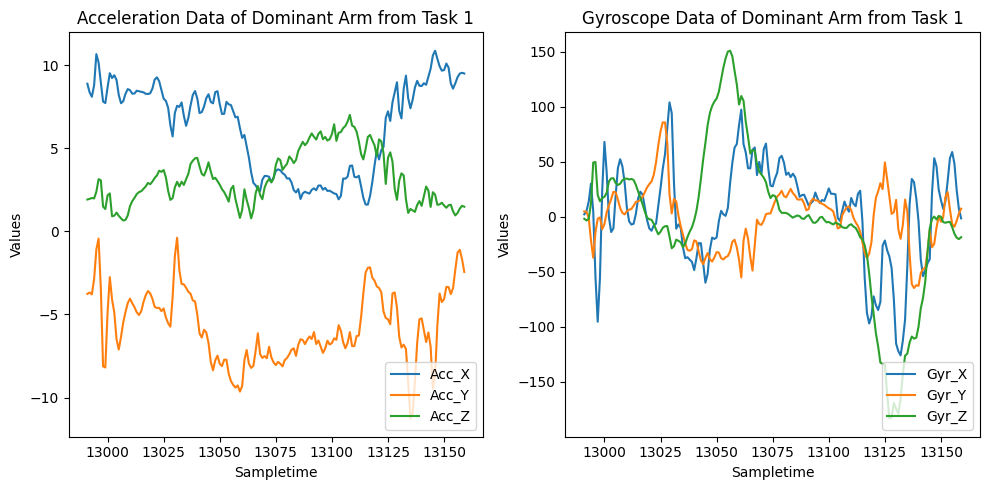

Task 1
Score: 0


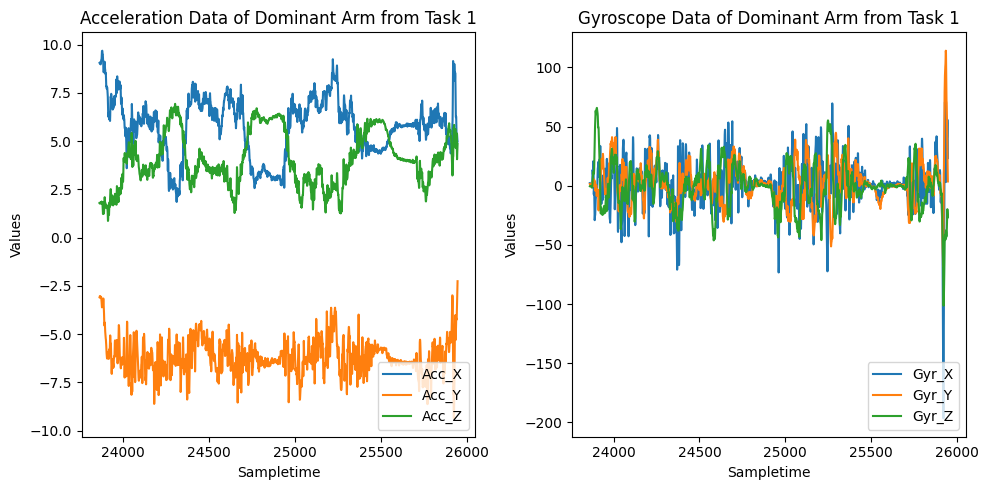

Task 1
Score: 3


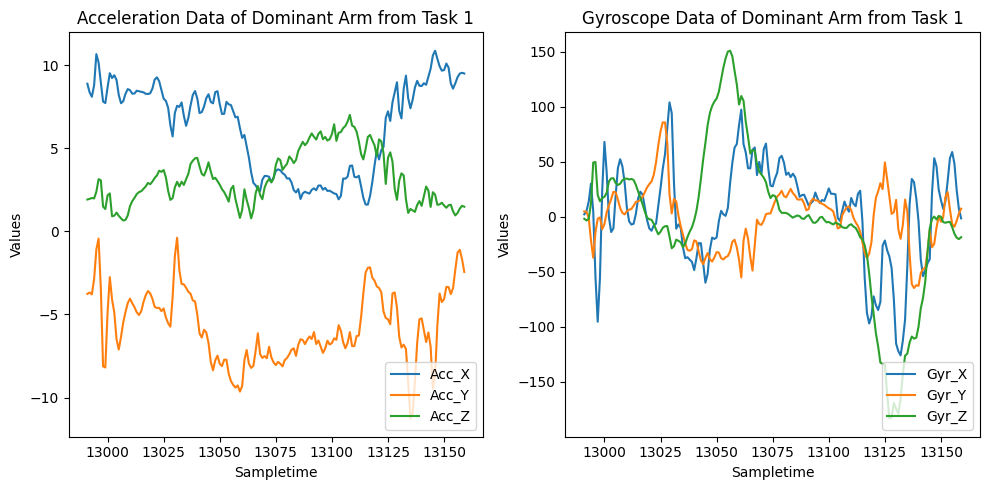

Task 1
Score: 0


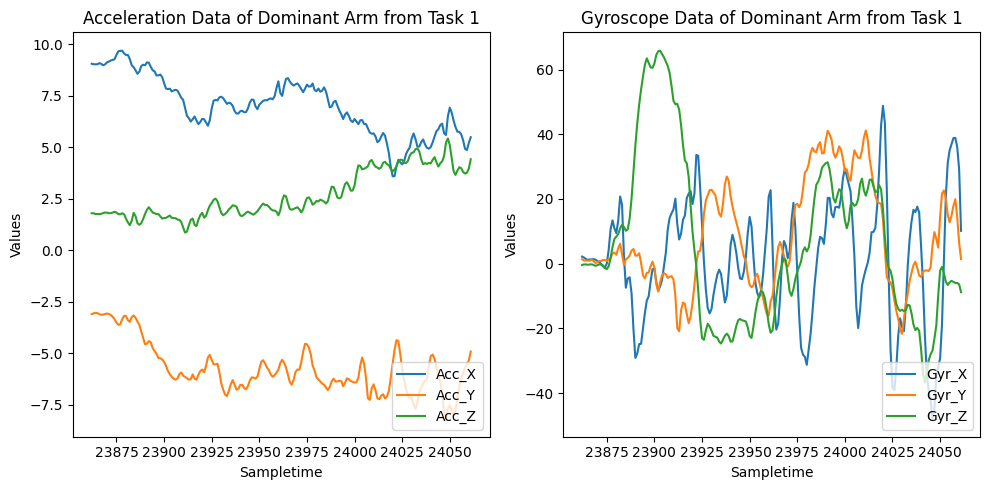

Task 1
Score: 3


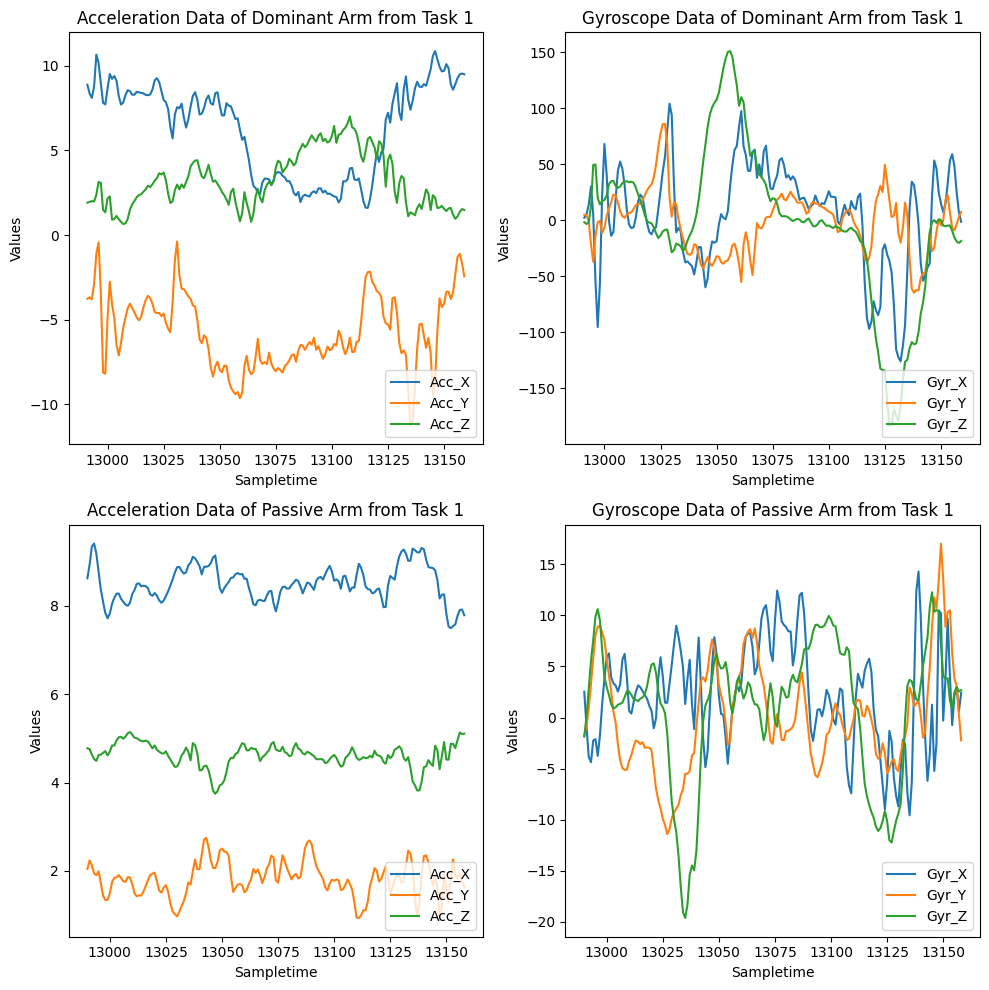

C:\Users\Admin\AppData\Local\Temp\ipykernel_3004\867846937.py:29: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  armd = pd.read_csv(os.path.join(patient1, './right_arm.csv'), header=10, sep=',')


Task 1
Score: 2


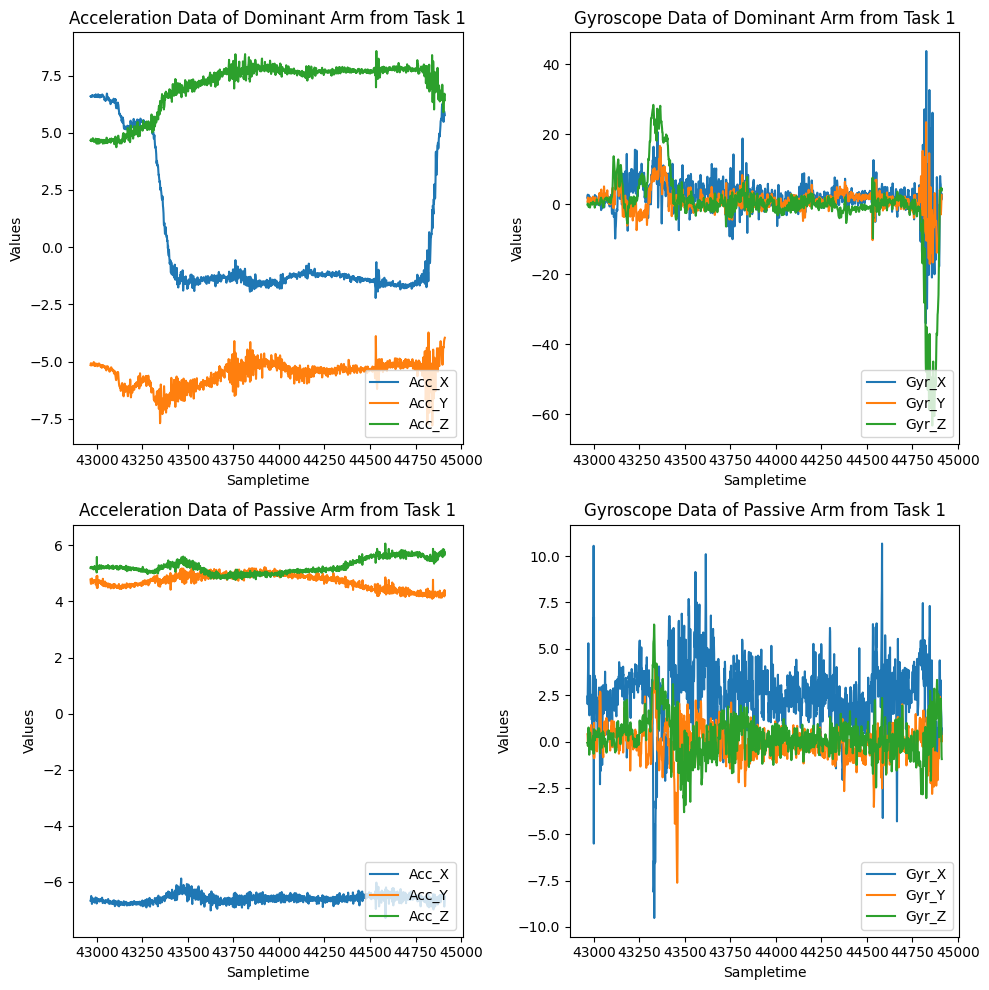

Task 1
Score: 0


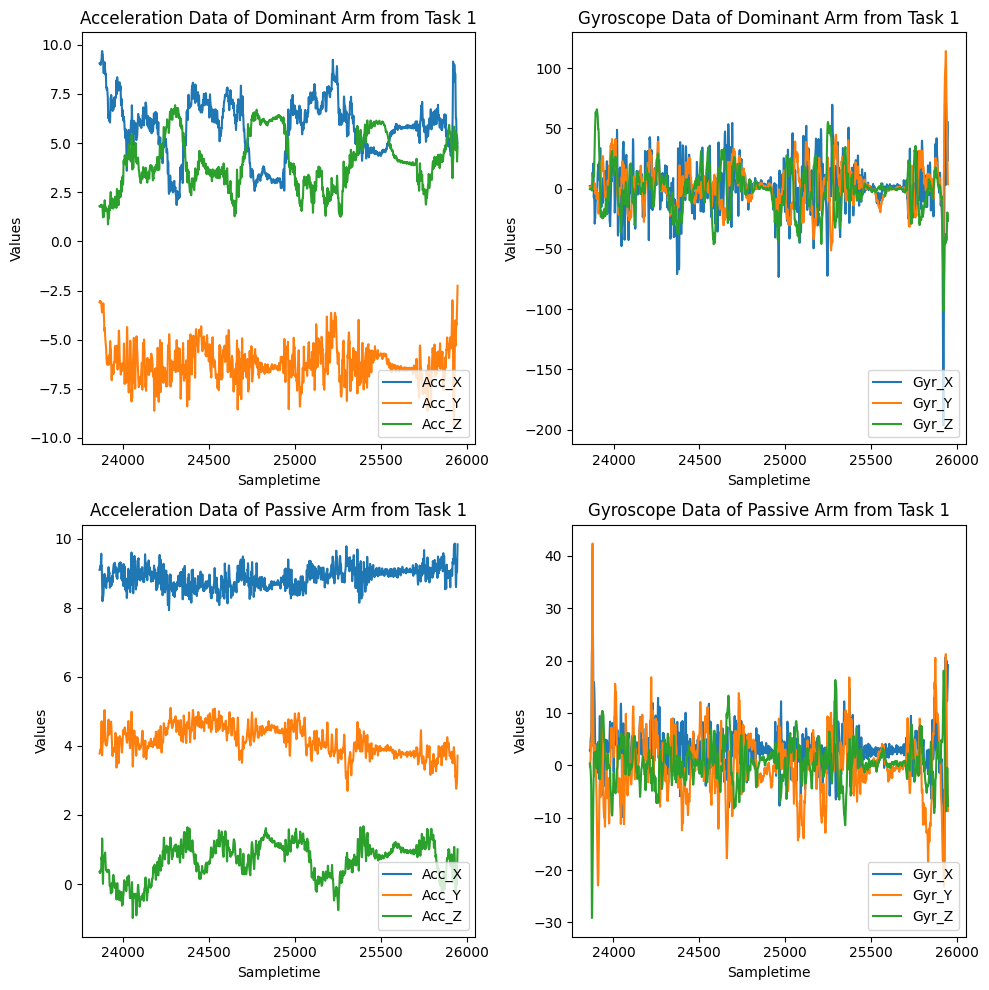

In [1]:
import matplotlib.pyplot as plt
import os
import pandas as pd

def plot_data(ax, data, labels, title, slicetime=None):

    if slicetime:
        data_slice = data.iloc[:slicetime]
    else:
        data_slice = data
    
    ax.plot(data_slice.index, data_slice[labels[0]], label=labels[0])
    ax.plot(data_slice.index, data_slice[labels[1]], label=labels[1])
    ax.plot(data_slice.index, data_slice[labels[2]], label=labels[2])
    
    ax.set_title(title)
    ax.set_xlabel('Sampletime')
    ax.set_ylabel('Values')
    ax.legend(loc=4)

def raw_data_plot(patient_number, appointment, task, passive=True, slicetime=None):
    patient1 = os.getcwd()
    patient1 = os.path.join(patient1, f'./LLUI iARAT/Patient_raw_data/{patient_number}/iARAT/{appointment}')

    compens = pd.read_csv(os.path.join(patient1, f'./{patient_number}_Compens.csv'), header=6, sep=';')
    note = pd.read_csv(os.path.join(patient1, f'./{patient_number}_Note.csv'), header=3, sep=';', on_bad_lines='skip')
    armd = pd.read_csv(os.path.join(patient1, './right_arm.csv'), header=10, sep=',')
    armp = pd.read_csv(os.path.join(patient1, './left_arm.csv'), header=10, sep=',')

    # Extract relevant task data
    task_number = note['Task_number'].iloc[task]
    task_time = compens[compens['Task number'] == str(task_number)]['TimeSample']
    task_armd = armd[armd['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
    task_armp = armp[armp['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
    score = note['Score'].iloc[task]
    print(f'Task {task_number}')
    print(f'Score: {score}')

    if passive:
        fig, ax = plt.subplots(2, 2, figsize=(10, 10))

        # First row: Right arm here dominant in task 1
        plot_data(ax[0, 0], task_armd, ['Acc_X', 'Acc_Y', 'Acc_Z'], 
                  f'Acceleration Data of Dominant Arm from Task {task_number}', slicetime)
        plot_data(ax[0, 1], task_armd, ['Gyr_X', 'Gyr_Y', 'Gyr_Z'], 
                  f'Gyroscope Data of Dominant Arm from Task {task_number}', slicetime)

        # Second row: Left arm 
        plot_data(ax[1, 0], task_armp, ['Acc_X', 'Acc_Y', 'Acc_Z'], 
                  f'Acceleration Data of Passive Arm from Task {task_number}', slicetime)
        plot_data(ax[1, 1], task_armp, ['Gyr_X', 'Gyr_Y', 'Gyr_Z'], 
                  f'Gyroscope Data of Passive Arm from Task {task_number}', slicetime)
    else:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))

        plot_data(ax[0], task_armd, ['Acc_X', 'Acc_Y', 'Acc_Z'], 
                  f'Acceleration Data of Dominant Arm from Task {task_number}', slicetime)
        plot_data(ax[1], task_armd, ['Gyr_X', 'Gyr_Y', 'Gyr_Z'], 
                  f'Gyroscope Data of Dominant Arm from Task {task_number}', slicetime)

    plt.tight_layout()
    plt.show()

raw_data_plot('5050359', 'A1', 0, passive=False) 
raw_data_plot('5051205', 'A1', 0, passive=False) 

raw_data_plot('5050359', 'A1', 0, passive=False, slicetime=200) 
raw_data_plot('5051205', 'A1', 0, passive=False, slicetime=200) 


raw_data_plot('5050359', 'A1', 0) # Score 3
raw_data_plot('5050513', 'A1', 0) # Score 2
# raw_data_plot('5050513', 'A1', 0) # Score 1 
raw_data_plot('5051205', 'A1', 0) # Score 0

# Feature Engineering

In [59]:
import os 
import numpy as np
import pandas as pd
from scipy.fft import fft
from scipy.stats import kurtosis, iqr

class FeatureExtraction():
    def __init__(self, root_directory):
        self.root_directory = root_directory
    
        # lists all folders in Patient_raw_data
        self.patient_folders = [f for f in os.listdir(self.root_directory)]
        self.patient_folders = np.array(self.patient_folders)

        self.notry = 0
        self.notask = 0
        self.nofiles = 0
        self.nocolumn = 0
        self.nocategory = 0
        self.notaskimu = 0
        self.noside = 0


    def configure(self):
        '''
        Function performs the feature extraction for all patients
        '''

        grasp = pd.DataFrame()
        grip = pd.DataFrame()
        pinch = pd.DataFrame()
        gross = pd.DataFrame()

        # for each patient in the root_directory
        for P_idx in range(len(self.patient_folders)):
            p_grasp, p_grip, p_pinch, p_gross = self.patient(P_idx) # returns the features from one patient and their appointments (may have multiple rows)

            # appends the new rows to each df
            grasp = pd.concat([grasp, p_grasp], axis=0)
            grip = pd.concat([grip, p_grip], axis=0)
            pinch = pd.concat([pinch, p_pinch], axis=0)
            gross = pd.concat([gross, p_gross], axis=0)

        return grasp, grip, pinch, gross
    
    def patient(self, P_idx):
        '''
        Function performs the feature extraction for each appointment of one patient
        '''
        print('Patient', P_idx, self.patient_folders[P_idx]) # to see were the code is when its running

        # gets inside patient/iARAT/
        patient_directory = os.path.join(self.root_directory, self.patient_folders[P_idx])
        self.patient_iarat_directory = os.path.join(patient_directory , 'iARAT')
        # lists all folders so all the different appointments (A1, A2, ...)
        self.appointment_folders = [f for f in os.listdir(self.patient_iarat_directory)]
        self.appointment_folders = np.array(self.appointment_folders)

        p_grasp = pd.DataFrame()
        p_grip = pd.DataFrame()
        p_pinch = pd.DataFrame()
        p_gross = pd.DataFrame()

        # for each appointment in the patient/iARAT/ folder
        for A_idx in range(len(self.appointment_folders)):
            a_grasp, a_grip, a_pinch, a_gross = self.appointment(P_idx, A_idx) # returns the features from one appointments (has only one row)

            # puts in the dfs a new column (Patient) with the value of a string with the patient number and appointment
            a_grasp.insert(0, 'Patient', [f'{self.patient_folders[P_idx]}_{self.appointment_folders[A_idx]}'] * len(a_grasp))
            a_grip.insert(0, 'Patient', [f'{self.patient_folders[P_idx]}_{self.appointment_folders[A_idx]}'] * len(a_grip))
            a_pinch.insert(0, 'Patient', [f'{self.patient_folders[P_idx]}_{self.appointment_folders[A_idx]}'] * len(a_pinch))
            a_gross.insert(0, 'Patient', [f'{self.patient_folders[P_idx]}_{self.appointment_folders[A_idx]}'] * len(a_gross))

            # appends the new row (one appointment) to each df
            p_grasp = pd.concat([p_grasp, a_grasp], axis=0)
            p_grip = pd.concat([p_grip, a_grip], axis=0)
            p_pinch = pd.concat([p_pinch, a_pinch], axis=0)
            p_gross = pd.concat([p_gross, a_gross], axis=0)
        
        return p_grasp, p_grip, p_pinch, p_gross

        
    def appointment(self, P_idx, A_idx):
        '''
        Function performs the feature extraction for each task in one appointment
        '''
        print('Appointments', A_idx, self.appointment_folders[A_idx]) # to see were the code is when its running

        appointment_directory = os.path.join(self.patient_iarat_directory, self.appointment_folders[A_idx])
        compens_directory = os.path.join(appointment_directory, (self.patient_folders[P_idx] + '_Compens.csv'))
        note_directory = os.path.join(appointment_directory, (self.patient_folders[P_idx] + '_Note.csv'))
        chest_directory = os.path.join(appointment_directory, 'chest.csv')
        arml_directory = os.path.join(appointment_directory, 'left_arm.csv')
        wristl_directory = os.path.join(appointment_directory, 'left_wrist.csv')
        armr_directory = os.path.join(appointment_directory, 'right_arm.csv')
        wristr_directory = os.path.join(appointment_directory, 'right_wrist.csv')

        a_grasp = pd.DataFrame()
        a_grip = pd.DataFrame()
        a_pinch = pd.DataFrame()
        a_gross = pd.DataFrame()

        # read the csv files and put the data into the specific df
        try:
            compens = pd.read_csv(compens_directory, header=6, sep=';')
        except FileNotFoundError as e: # sometimes there are missing files
            print(f"Error: Compens File not found. Details: {e}")
            compens = pd.DataFrame()
            self.nofiles += 1
        try:
            note = pd.read_csv(note_directory, header=3, sep=';', on_bad_lines='skip')
        except FileNotFoundError as e:
            print(f"Error: Note File not found. Details: {e}")
            note = pd.DataFrame()
            self.nofiles += 1
        try:
            arml = pd.read_csv(arml_directory, header=10)
        except FileNotFoundError as e:
            print(f"Error: Arm Left File not found. Details: {e}")
            arml = pd.DataFrame()
            self.nofiles += 1
        try:
            armr = pd.read_csv(armr_directory, header=10)
        except FileNotFoundError as e:
            print(f"Error: Arm Right File not found. Details: {e}")
            armr = pd.DataFrame()
            self.nofiles += 1
        try:
            chest = pd.read_csv(chest_directory, header=10)
        except FileNotFoundError as e:
            print(f"Error: Chest File not found. Details: {e}")
            chest = pd.DataFrame()
            self.nofiles += 1
        try:
            wristl = pd.read_csv(wristl_directory, header=10)
        except FileNotFoundError as e:
            print(f"Error: Wrist Left File not found. Details: {e}")
            wristl = pd.DataFrame()
            self.nofiles += 1
        try:
            wristr = pd.read_csv(wristr_directory, header=10)
        except FileNotFoundError as e:
            print(f"Error: Wrist Right File not found. Details: {e}")
            wristr = pd.DataFrame()
            self.nofiles += 1

        # each task from an appointment
        for i in range(len(note)):
            # print('in task', i) # for troubleshooting
            task = pd.DataFrame() # features
            task_number = note['Task_number'].iloc[i]
            number_of_try = note['Number of try'].iloc[i]
            category = note['Categorie'].iloc[i]
            score = note['Score'].iloc[i]
            side = note['Side'].iloc[i]
            
            if number_of_try == 0: # if there were no tries then there is no task time 
                self.notry += 1
                continue # next task
            
            elif number_of_try > 1: # multiple tries were recorded
                selected = note['Selected,'].iloc[i] # the try which the therapist scored and therefore the try we are intrested in
                selected = int(selected.replace(',', '')) # because it is at the end of the row in note.csv selected looks like '2,', so the comma is taken out and converted into an integer

                all_tries = compens[compens['Task number'] == str(task_number)]['TimeSample'] # returns all the TimeSamples with the specific task number

                if not all_tries.empty:
                    current_try = [] # will be just a simple list (uses the iloc index e.g.(0 ... 300))
                    grouped = [] # will be a nested list like [[try 1], [try 2]] (uses the iloc index e.g.(0 ... 300))

                    for j in range((len(all_tries)-1)): 
                        if all_tries.index[j+1] == (all_tries.index[j] + 1): # if it is consecutive, append it to the current try (uses the compens index e.g.(18000 ... 18300))
                            current_try.append(j) # (uses the iloc index e.g.(0 ... 300))
                        else: # when the index are not consecutive 
                            grouped.append(current_try) # appends the whole list of the one try 
                            current_try = [j] # resets the list and implements the first iloc index from the new try (uses the iloc index e.g.(0 ... 300))

                    current_try.append(len(all_tries) - 1) # last index because the loop ends at the second last because of [j+1] so that it does not run out of range
                    grouped.append(current_try) # appends the list of the last try

                    task_time = all_tries.iloc[grouped[selected-1]] # just returns the TimeSamples of the selected try

            else: # if there is just one try
                # print(compens.columns) # for troubleshooting
                task_time = compens[compens['Task number'] == str(task_number)]['TimeSample'] # returns the TimeSamples with the specific task number

            if not task_time.empty:
                # extract the features from each IMU and append the new columns to the task df

                task_ch = pd.read_csv('chest_empty.csv', sep=',', header=0) # assume that there is an empty file
                if not chest.empty: # if there was a file overwrite task_ch
                    task_chest = chest[chest['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
                    if not task_chest.empty: 
                        task_ch = self.features(task_chest, 'chest')
                    else: # when timesamples of compens and here chest file dont correspond
                        self.notaskimu += 1
                task = task_ch

                if side == 'right':
                    arm_dom = armr
                    wrist_dom = wristr
                    arm_pa = arml
                    wrist_pa = wristl
                elif side == 'left':
                    arm_dom = arml
                    wrist_dom = wristl
                    arm_pa = armr
                    wrist_pa = wristr
                else:
                    self.noside += 1 # if the values is neither right or left
                    arm_dom = pd.DataFrame()
                    wrist_dom = pd.DataFrame()
                    arm_pa = pd.DataFrame()
                    wrist_pa = pd.DataFrame()
                
                task_ad = pd.read_csv('arm_dom_empty.csv', sep=',', header=0)
                if not arm_dom.empty:
                    task_arm_dom = arm_dom[arm_dom['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
                    if not task_arm_dom.empty:
                        task_ad = self.features(task_arm_dom, 'arm_dominant')
                    else:
                        self.notaskimu += 1
                task = pd.concat([task, task_ad], axis=1)

                task_ap = pd.read_csv('arm_pa_empty.csv', sep=',', header=0)
                if not arm_pa.empty:
                    task_arm_pa = arm_pa[arm_pa['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
                    if not task_arm_pa.empty:
                        task_ap = self.features(task_arm_pa, 'arm_passive')
                    else:
                        self.notaskimu += 1
                task = pd.concat([task, task_ap], axis=1)

                task_wd = pd.read_csv('wrist_dom_empty.csv', sep=',', header=0)
                if not wrist_dom.empty:
                    task_wrist_dom = wrist_dom[wrist_dom['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
                    if not task_wrist_dom.empty:
                        task_wd = self.features(task_wrist_dom, 'wrist_dominant')
                    else:
                        self.notaskimu += 1
                task = pd.concat([task, task_wd], axis=1)

                task_wp = pd.read_csv('wrist_pa_empty.csv', sep=',', header=0)
                if not wrist_pa.empty:
                    task_wrist_pa = wrist_pa[wrist_pa['SampleTimeFine'].isin(task_time)][['Acc_X', 'Acc_Y', 'Acc_Z', 'Gyr_X', 'Gyr_Y', 'Gyr_Z']]
                    if not task_wrist_pa.empty:
                        task_wp = self.features(task_wrist_pa, 'wrist_passive')
                    else:
                        self.notaskimu += 1
                task = pd.concat([task, task_wp], axis=1)

                task['Score'] = score

                # append the new columns (features from one task) to each df
                if category == 'GRASP':
                    a_grasp = pd.concat([a_grasp, task], axis=0)
                elif category == 'GRIP':
                    a_grip = pd.concat([a_grip, task], axis=0)
                elif category == 'PINCH':
                    a_pinch = pd.concat([a_pinch, task], axis=0)
                elif category == 'GROSS':
                    a_gross = pd.concat([a_gross, task], axis=0)
                else:
                    self.nocategory += 1
                    print('Error not valid category')
            else:
                self.notask += 1 # when the task number is not found in the compens file or the compens file is empty

        return a_grasp, a_grip, a_pinch, a_gross

    def features(self, data, name):
        '''
        Function extracts the all the features for each time series from one IMU

        Extracts following features:
        - Mean
        - Standard Deviation
        - 5th Percentile
        - 95th Percentile
        - Range
        - Mean Absolute Deviation (MAD): is a measure of the spread of data points around the mean. It gives an idea of how far, on average, each data point is from the mean of the dataset.
        - Interquartile Range (IQR): measures the spread of the middle 50% of the data. It is the difference between the 75th percentile (upper quartile) and the 25th percentile (lower quartile)
        - 75th Percentile
        - Zero-Crossing Rate (ZCR): is the rate at which the signal changes its sign (from positive to negative or vice versa). 
        - Kurtosis: is a statistical measure that describes the shape of the data distribution, specifically the "tailedness" of the distribution. High kurtosis means that the distribution has heavy tails or outliers.
        
        - Time Domain features of the magnitude of the Acc vector and the Gyr vector
        '''

        features = pd.DataFrame()
        
        # iterates through each acc / gyr axis
        for i in data.columns:
            if data[i].empty:
                print(f"Column {data[i]} in {name} is empty. Skipping calculations.")
                self.nocolumn += 1 # when there is a whole IMU direction missing
                continue

            # calculates various features for each acc /gyr
            data[i] = pd.to_numeric(data[i], errors='coerce') # makes sure that all values are numbers, 'coerce' converts errors to NaN

            features[f'{name}_{i}_mean'] = [np.mean(data[i])]
            # print(features.columns)
            features[f'{name}_{i}_std_dev'] = [np.std(data[i])]
            features[f'{name}_{i}_min_5th'] = [np.percentile(data[i], 5)]
            features[f'{name}_{i}_max_95th'] = [np.percentile(data[i], 95)]
            features[f'{name}_{i}_range'] = [np.max(data[i]) - np.min(data[i])]
            features[f'{name}_{i}_mad'] = [np.mean(np.abs(data[i] - np.mean(data[i])))] # mean absolute deviation
            features[f'{name}_{i}_iqr'] = [iqr(data[i])] # interquartile range
            features[f'{name}_{i}_upper_quartile'] = [np.percentile(data[i], 75)] # upper quartile (75th percentile)
            features[f'{name}_{i}_zcr'] = [np.count_nonzero(np.diff(np.sign(data[i])))] # zero-crossing rate
            features[f'{name}_{i}_kurtosis'] = [kurtosis(data[i])] 
            
        
        # computes the magnitude of either the Acc vector and the Gyr vector 
        acc = np.sqrt(data['Acc_X']**2 + data['Acc_Y']**2 + data['Acc_Z']**2)
        gyr = np.sqrt(data['Gyr_X']**2 + data['Gyr_Y']**2 + data['Gyr_Z']**2)

        # gets the accelerometer and gyroscope time domain features and appends to the other features
        features = pd.concat([features, self.time_domain(acc, f'{name}_acc')], axis=1)
        features = pd.concat([features, self.time_domain(gyr, f'{name}_gyr')], axis=1)

        # print(features.columns)

        return features

    def time_domain(self, data, name):
        '''
        Function extracts the time domain features for the magnitude of either the Acc vector or the Gyr vector

        Extracts following features:
        - Max Frequency: corresponds to the dominant frequency (the frequency at which the signal has the highest power)
        - Power of Frequency Bands: computes the power (squared magnitude) in specific frequency bands
            - 0-5Hz
            - 5-10Hz
            - 10-15Hz
            - 15-20Hz
            - 20-25Hz
        - Spectral Centroid: is a measure of the "center of mass" of the spectrum and can be thought of as the "average" frequency, weighted by the power at each frequency.
        '''

        features = pd.DataFrame()

        fs = 500 # sample frequency
        N = len(data)
        X = fft(data) # fast fourier transform
        freqs = np.fft.fftfreq(N, d=1/fs) # gets the different frequencies

        magnitude = np.abs(X)

        max_freq_idx = np.argmax(magnitude)
        features[f'{name}_max_freq'] = [np.abs(freqs[max_freq_idx])]
        
        # power of frequency bands
        features[f'{name}_0-5Hz'] = [np.sum(magnitude[(freqs >= 0) & (freqs < 5)]**2)]
        features[f'{name}_5-10Hz'] = [np.sum(magnitude[(freqs >= 5) & (freqs < 10)]**2)]
        features[f'{name}_10-15Hz'] = [np.sum(magnitude[(freqs >= 10) & (freqs < 15)]**2)]
        features[f'{name}_15-20Hz'] = [np.sum(magnitude[(freqs >= 15) & (freqs < 20)]**2)]
        features[f'{name}_20-25Hz'] = [np.sum(magnitude[(freqs >= 20) & (freqs < 25)]**2)]

        features[f'{name}_spectral_centroid'] = [np.sum(freqs * magnitude**2) / np.sum(magnitude**2)]

        return features

In [60]:
root_directory = os.getcwd()
root_directory = os.path.join(root_directory, './LLUI iARAT/Patient_raw_data')

fe = FeatureExtraction(root_directory)
grasp, grip, pinch, gross = fe.configure()

Patient 0 5050359
Appointments 0 A1
Patient 1 5050513
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Patient 2 5050673
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Appointments 3 A4


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Appointments 4 A5
Appointments 5 A6
Patient 3 5050739
Appointments 0 A1
Error: Arm Left File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5050739\\iARAT\\A1\\left_arm.csv'


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 2 A3
Patient 4 5050903
Appointments 0 A1
Appointments 1 A2
Patient 5 5050945
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Patient 6 5051002
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Appointments 1 A2
Patient 7 5051205
Appointments 0 A1
Appointments 1 A2
Error: Compens File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051205\\iARAT\\A2\\5051205_Compens.csv'
Error: Note File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051205\\iARAT\\A2\\5051205_Note.csv'
Error: Arm Left File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051205\\iARAT\\A2\\left_arm.csv'
Error: Arm Right File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabil

C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Appointments 2 A3
Appointments 3 A4
Patient 8 5051208
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Patient 9 5051573
Appointments 0 A1
Patient 10 5051604
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Patient 11 5051610
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)


Patient 12 5051632
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Patient 13 5051638
Appointments 0 A1
Patient 14 5051639
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Appointments 2 A3


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Appointments 3 A4
Patient 15 5051661
Appointments 0 A1
Appointments 1 A2
Error: Wrist Right File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051661\\iARAT\\A2\\right_wrist.csv'
Patient 16 5051664
Appointments 0 A1
Appointments 1 A2
Patient 17 5051665
Appointments 0 A1
Appointments 1 A2
Patient 18 5051671
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Patient 19 5051673
Appointments 0 A1
Patient 20 5051674
Appointments 0 A1
Patient 21 5051679
Appointments 0 A1
Error: Compens File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051679\\iARAT\\A1\\5051679_Compens.csv'
Error: Note File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051679\\iARAT\\A1\\5051679_Note.csv'
Appointments 1 A2
Appointments 2 A3
Patient 22 5051686
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Appointments 3 A4
Patient 23 5051695
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 2 A3


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 3 A4


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 4 A5
Error: Arm Left File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051695\\iARAT\\A5\\left_arm.csv'
Patient 24 5051708
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)


Appointments 2 A3
Patient 25 5051709
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 2 A3
Patient 26 5051717
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 1 A10


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 2 A11
Appointments 3 A2
Appointments 4 A3
Appointments 5 A4


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 6 A5
Appointments 7 A6
Appointments 8 A7


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 9 A8


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Appointments 10 A9
Patient 27 5051737
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 2 A3
Appointments 3 A4
Appointments 4 A5


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 5 A6
Patient 28 5051756
Appointments 0 A1
Patient 29 5051779
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Patient 30 5051784
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Appointments 3 A4
Patient 31 5051791
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 2 A3
Appointments 3 A4
Appointments 4 A5


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 5 A6
Patient 32 5051798
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Patient 33 5051809
Appointments 0 A1
Patient 34 5051810
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Patient 35 5051811
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)


Appointments 1 A2
Appointments 2 A3
Patient 36 5051815
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:135: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  wristl = pd.read_csv(wristl_directory, header=10)


Patient 37 5051816
Appointments 0 A1
Patient 38 5051826
Appointments 0 A1
Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:123: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  armr = pd.read_csv(armr_directory, header=10)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:129: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  chest = pd.read_csv(chest_directory, header=10)


Appointments 2 A3
Appointments 3 A4
Patient 39 5051855
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Error: Chest File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051855\\iARAT\\A3\\chest.csv'


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 3 A4
Error: Chest File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051855\\iARAT\\A4\\chest.csv'


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Patient 40 5051856
Appointments 0 A1
Appointments 1 A2
Appointments 2 A3
Error: Chest File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051856\\iARAT\\A3\\chest.csv'
Patient 41 5051874
Appointments 0 A1


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Appointments 1 A2
Error: Arm Right File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051874\\iARAT\\A2\\right_arm.csv'
Appointments 2 A3


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:141: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  wristr = pd.read_csv(wristr_directory, header=10)


Patient 42 5051876
Appointments 0 .DS_Store
Error: Compens File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051876\\iARAT\\.DS_Store\\5051876_Compens.csv'
Error: Note File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051876\\iARAT\\.DS_Store\\5051876_Note.csv'
Error: Arm Left File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051876\\iARAT\\.DS_Store\\left_arm.csv'
Error: Arm Right File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation

C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)


Appointments 1 A2


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)


Appointments 2 A3


C:\Users\Admin\AppData\Local\Temp\ipykernel_19104\2155908671.py:117: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  arml = pd.read_csv(arml_directory, header=10)


Patient 47 5051913
Appointments 0 A1
Error: Arm Right File not found. Details: [Errno 2] No such file or directory: 'c:\\Users\\Admin\\OneDrive\\Dokumente\\ETH\\Semester 7\\Artificial Inteligence in Rehabilitation\\Project\\./LLUI iARAT/Patient_raw_data\\5051913\\iARAT\\A1\\right_arm.csv'
Patient 48 5051925
Appointments 0 A1


In [64]:
grasp.to_csv('grasp_features.csv', index=False)
grip.to_csv('grip_features.csv', index=False)
pinch.to_csv('pinch_features.csv', index=False)
gross.to_csv('gross_features.csv', index=False)

In [71]:
# print(f'No tries average per Appointment: {fe.notry/129}')

print(f'How often a task was not tried (Number of try = 0): {fe.notry}')
print(f'How often in compens there is not the task number, due to for example an empty compens file: {fe.notask}')
print(f'How often a file is not properly named or missing: {fe.nofiles}')
print(f'How often a whole direction of a task is missing: {fe.nocolumn}')
print(f'How often the category in note is missing or misspelled: {fe.nocategory}')
print(f'How often there is no IMU data from the chest/arm/wrist of a task, due to different timesamples in compens and the imu file: {fe.notaskimu}')
print(f'How often a side was not recognized: {fe.noside}')

print(f'''The other NAN values are due to changing the data into numeric values for the feature calculation, 
if the code canot convert then it is NAN value, this could happen for example if the csv file is not correctly separated with the same separater''')

How often a task was not tried (Number of try = 0): 1497
How often in compens there is not the task number, due to for example an empty compens file: 39
How often a file is not properly named or missing: 31
How often a whole direction of a task is missing: 0
How often the category in note is missing or misspelled: 0
How often there is no IMU data from the chest/arm/wrist of a task, due to different timesamples in compens and the imu file: 400
How often a side was not recognized: 0
The other NAN values are due to changing the data into numeric values for the feature calculation, 
if the code canot convert then it is NAN value, this could happen for example if the csv file is not correctly separated with the same separater


# Preprocessing

In [2]:
import pandas as pd

pd.set_option('display.max_columns', None, 'display.max_rows', None)  # No limit on number of columns and rows

grasp = pd.read_csv('grasp_features.csv', header=0)
grip = pd.read_csv('grip_features.csv', header=0)
pinch = pd.read_csv('pinch_features.csv', header=0)
gross = pd.read_csv('gross_features.csv', header=0)

### Missing Values

In [2]:
print('Missing Values')
total_missing = 0
total_values = 0

datasets = [grasp, grip, pinch, gross]
names = ['Grasp', 'Grip', 'Pinch', 'Gross']

# Loop through datasets and names
for i in range(len(datasets)):
    total_missing += datasets[i].isna().sum().sum()
    total_values += datasets[i].size
    print(f'{names[i]}: {(datasets[i].isna().sum().sum()) * 100 / (datasets[i].size):.3}%')


overall_percentage = total_missing / total_values * 100
print(f"Overall: {overall_percentage:.3}%")

Missing Values
Grasp: 3.54%
Grip: 3.8%
Pinch: 4.1%
Gross: 4.37%
Overall: 3.95%


In [3]:
print(grasp.shape)
print(grip.shape)
print(pinch.shape)
print(gross.shape)

(719, 372)
(1005, 372)
(786, 372)
(756, 372)


Visualize missing data

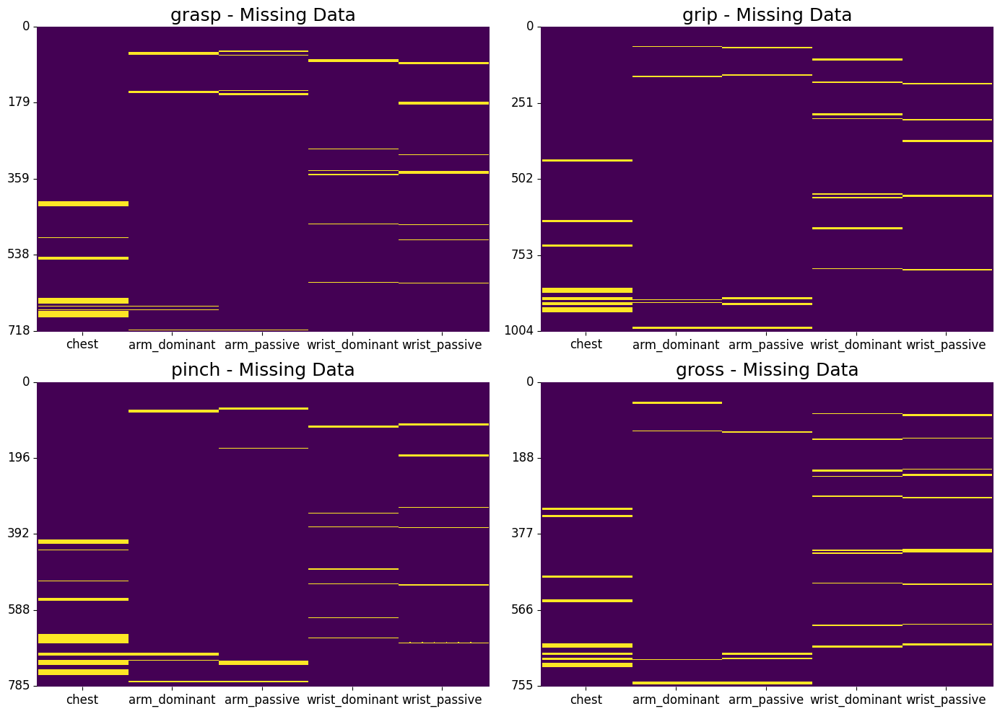

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

def visualize_missing(df_list, names):
    """
    Visualizes missing values for multiple datasets in a 2x2 grid.

    Parameters:
    df_list (list of pd.DataFrame): List of datasets to visualize.
    names (list of str): List of dataset names corresponding to each dataset.
    output_folder (str): Folder to save the plots.
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    
    axes = axes.flatten() # flatten axes for easier iteration
    num_ticks = 5
    x_ticks = [37, 111, 185, 259, 333]
    x_labels = ['chest', 'arm_dominant', 'arm_passive', 'wrist_dominant', 'wrist_passive']


    # Loop through datasets and names
    for i, (df, name) in enumerate(zip(df_list, names)):
        sns.heatmap(df.isnull(), ax=axes[i], cbar=False, cmap="viridis")
        axes[i].set_title(f"{name} - Missing Data", fontsize=18)

        y_ticks = np.linspace(0, len(df) - 1, num_ticks).astype(int)
        axes[i].set_yticks(y_ticks)
        axes[i].set_yticklabels([df.index[tick] for tick in y_ticks], fontsize=12)

        axes[i].set_xticks(x_ticks)
        axes[i].set_xticklabels(x_labels, rotation=0, ha='center', fontsize=12)

    plt.tight_layout()
    plt.show()


datasets = [grasp, grip, pinch, gross]
names = ["grasp", "grip", "pinch", "gross"]

visualize_missing(datasets, names)

### Train-Test Split and Standardization

In [4]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler

def prepare_data(data, target_column='Score', group_column='Patient', n_splits=5, random_state=42):
    """
    Prepares data for training and testing with StratifiedGroupKFold split and scaling.
    
    Args:
        data (pd.DataFrame): The dataset to process.
        target_column (str): The column name for the target variable.
        group_column (str): The column name for the group variable ('Patient').
        n_splits (int): Number of splits for StratifiedGroupKFold.
        random_state (int): Random state for reproducibility.
    
    Returns:
        X_train_scaled (np.array): Scaled training features.
        X_test_scaled (np.array): Scaled test features.
        y_train (pd.Series): Training target variable.
        y_test (pd.Series): Test target variable.
    """
    # Drop rows where y (target) is missing
    if data[target_column].isna().sum() >0:
        data = data.dropna(subset=[target_column])
    
    # Fill rest of Nan values with 0
    data = data.fillna(0)
    
    # Update X and y after dropping rows
    X = data.drop(columns=[group_column, target_column])  # Re-extract X without dropped rows
    y = data[target_column]  # Re-extract y without dropped rows

    # Initialize StratifiedGroupKFold
    skf = StratifiedGroupKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    
    # Perform the split
    for train_idx, test_idx in skf.split(X, y, groups=data[group_column]):
        train_set = data.iloc[train_idx]
        test_set = data.iloc[test_idx]
        break  # Only use the first split. 

    # Separate features and target for train and test sets
    X_train = train_set.drop(columns=[group_column, target_column])
    y_train = train_set[target_column]
    X_test = test_set.drop(columns=[group_column, target_column])
    y_test = test_set[target_column]

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    return X_train_scaled, X_test_scaled, y_train, y_test

# Prepare data for grasp
X_train_grasp, X_test_grasp, y_train_grasp, y_test_grasp = prepare_data(grasp)

# Prepare data for grip
X_train_grip, X_test_grip, y_train_grip, y_test_grip = prepare_data(grip)

# Prepare data for pinch
X_train_pinch, X_test_pinch, y_train_pinch, y_test_pinch = prepare_data(pinch)

# Prepare data for gross
X_train_gross, X_test_gross, y_train_gross, y_test_gross = prepare_data(gross)

c:\Users\Admin\OneDrive\Dokumente\ETH\Semester 7\Artificial Inteligence in Rehabilitation\.venv\Lib\site-packages\sklearn\model_selection\_split.py:994: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


In [6]:
print(f'Overall Grasp shape: {grasp.shape}')
print(f'Train shape: X: {X_train_grasp.shape}, y: {y_train_grasp.shape}')
print(f'Test shape: X: {X_test_grasp.shape}, y: {y_test_grasp.shape}')

Overall Grasp shape: (719, 372)
Train shape: X: (553, 370), y: (553,)
Test shape: X: (166, 370), y: (166,)


### Visualization

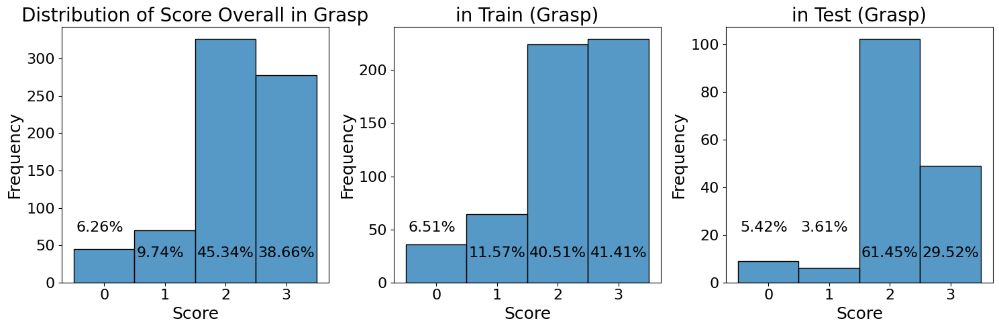

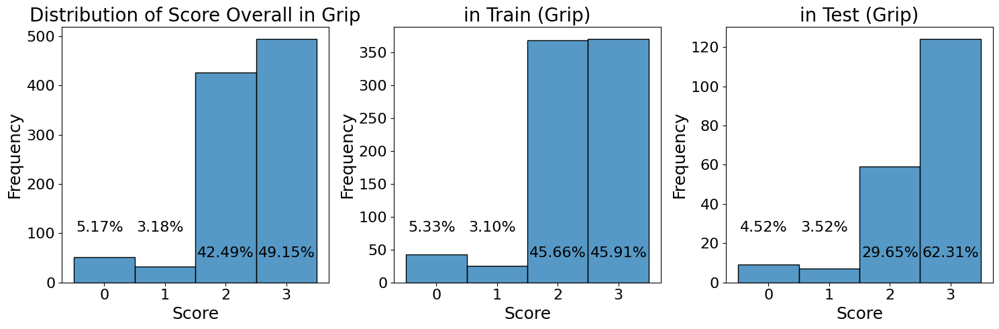

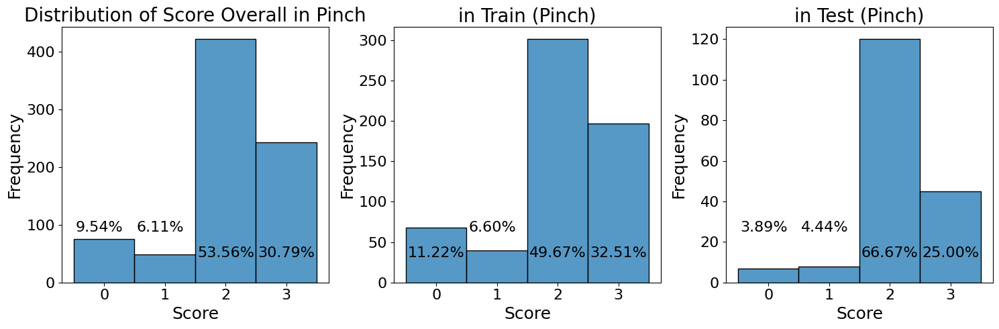

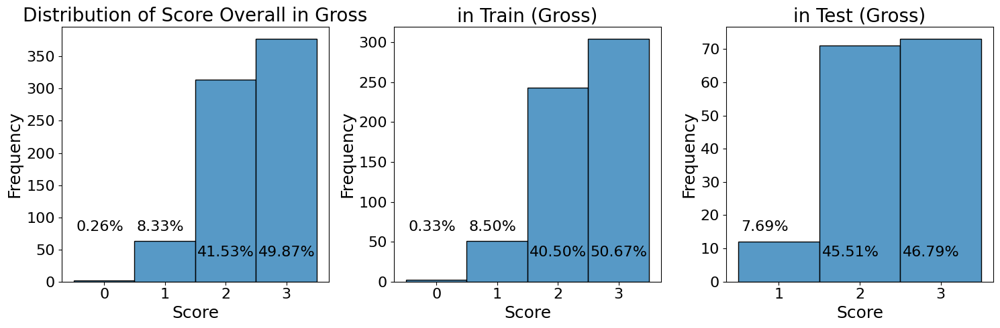

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator


def show_percentage(df, axes, fontsize=12):
    total = df.shape[0]
    y_axis_height = axes.get_ylim()[1] - axes.get_ylim()[0]
    for p in axes.patches:
        percentage = '{:.2f}%'.format(100 * p.get_height()/total)
        x = (p.get_x() + p.get_width() / 3.0) -0.3
        y = (p.get_y() + 0.5 * p.get_height())
        if y < 0.1 * y_axis_height:
            y = 0.2 * y_axis_height 
        else: 
            y = 0.1 * y_axis_height
        axes.annotate(percentage, (x, y), fontsize=fontsize)

def plot_score_distribution(data, train_set, test_set, category_name):
    """
    Plots and saves the score distribution overall, in the training set, and in the testing set.
    
    Parameters:
    - data: pd.DataFrame, the overall dataset for the category (e.g., grasp, grip)
    - train_set: pd.DataFrame, the training set
    - test_set: pd.DataFrame, the testing set
    - category_name: str, name of the category for labeling the plots
    - output_dir: str, directory where the plots will be saved (default is output_folder)
    """
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    sns.histplot(data['Score'], bins=data['Score'].nunique(), discrete=True, ax=axes[0])
    axes[0].xaxis.set_major_locator(MaxNLocator(integer=True))
    axes[0].set_title(f'Distribution of Score Overall in {category_name}', fontsize=20)
    axes[0].set_xlabel('Score', fontsize=18)
    axes[0].set_ylabel('Frequency', fontsize=18)
    axes[0].tick_params(axis='both', labelsize=16)
    
    show_percentage(data['Score'], axes[0], fontsize=16)

    sns.histplot(train_set, bins=train_set.nunique(), discrete=True, ax=axes[1])
    axes[1].xaxis.set_major_locator(MaxNLocator(integer=True))
    axes[1].set_title(f'in Train ({category_name})', fontsize=20)
    axes[1].set_xlabel('Score', fontsize=18)
    axes[1].set_ylabel('Frequency', fontsize=18)
    axes[1].tick_params(axis='both', labelsize=16)
    
    show_percentage(train_set, axes[1], fontsize=16)

    sns.histplot(test_set, bins=test_set.nunique(), discrete=True, ax=axes[2])
    axes[2].xaxis.set_major_locator(MaxNLocator(integer=True))
    axes[2].set_title(f'in Test ({category_name})', fontsize=20)
    axes[2].set_xlabel('Score', fontsize=18)
    axes[2].set_ylabel('Frequency', fontsize=18)
    axes[2].tick_params(axis='both', labelsize=16)
    
    show_percentage(test_set, axes[2], fontsize=16)

    plt.tight_layout()
    plt.show()

# For grasp
plot_score_distribution(grasp, y_train_grasp, y_test_grasp, 'Grasp')

# For grip
plot_score_distribution(grip, y_train_grip, y_test_grip, 'Grip')

# For pinch
plot_score_distribution(pinch, y_train_pinch, y_test_pinch, 'Pinch')

# For gross
plot_score_distribution(gross, y_train_gross, y_test_gross, 'Gross')

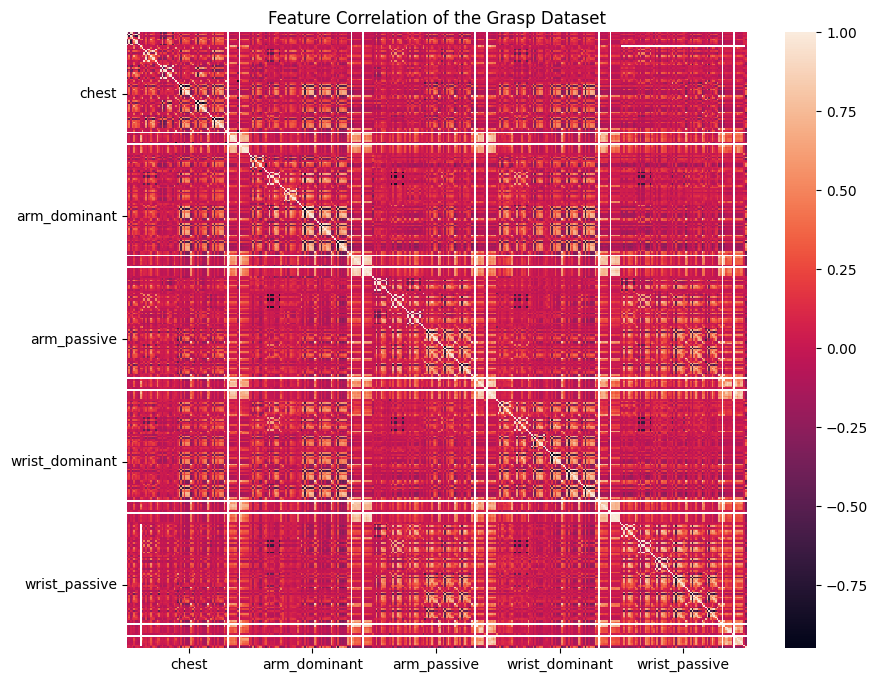

In [6]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap((grasp.select_dtypes('number').corr()))
ticks = [37, 111, 185, 259, 333]
labels = ['chest', 'arm_dominant', 'arm_passive', 'wrist_dominant', 'wrist_passive']
plt.title('Feature Correlation of the Grasp Dataset')
plt.xticks(ticks=ticks, labels=labels, rotation=0, ha='center')
plt.yticks(ticks=ticks, labels=labels, rotation=0)
plt.show()

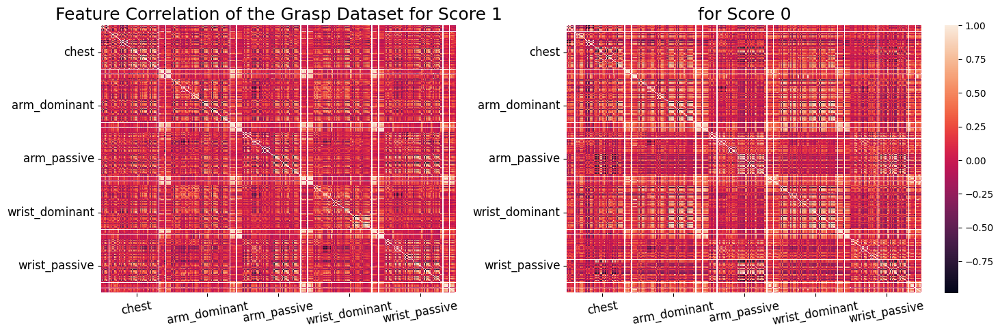

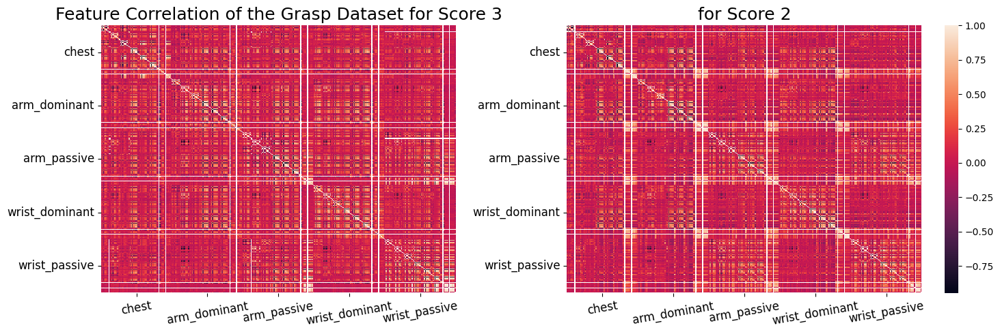

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [0.8, 1]})
ticks = [37, 111, 185, 259, 333]
labels = ['chest', 'arm_dominant', 'arm_passive', 'wrist_dominant', 'wrist_passive']

sns.heatmap(grasp[grasp['Score'] == 1].select_dtypes('number').corr(), ax=axes[0], cbar=False)
axes[0].set_title('Feature Correlation of the Grasp Dataset for Score 1', fontsize=18)
axes[0].set_xticks(ticks)  
axes[0].set_xticklabels(labels, rotation=10, ha='center', fontsize=12)
axes[0].set_yticks(ticks)  
axes[0].set_yticklabels(labels, rotation=0, fontsize=12)

sns.heatmap(grasp[grasp['Score'] == 0].select_dtypes('number').corr(), ax=axes[1], cbar=True)
axes[1].set_title('for Score 0', fontsize=18)
axes[1].set_xticks(ticks)  
axes[1].set_xticklabels(labels, rotation=10, ha='center', fontsize=12)
axes[1].set_yticks(ticks)  
axes[1].set_yticklabels(labels, rotation=0, fontsize=12)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [0.8, 1]})
ticks = [37, 111, 185, 259, 333]
labels = ['chest', 'arm_dominant', 'arm_passive', 'wrist_dominant', 'wrist_passive']

sns.heatmap(grasp[grasp['Score'] == 3].select_dtypes('number').corr(), ax=axes[0], cbar=False)
axes[0].set_title('Feature Correlation of the Grasp Dataset for Score 3', fontsize=18)
axes[0].set_xticks(ticks)  
axes[0].set_xticklabels(labels, rotation=10, ha='center', fontsize=12)
axes[0].set_yticks(ticks)  
axes[0].set_yticklabels(labels, rotation=0, fontsize=12)

sns.heatmap(grasp[grasp['Score'] == 2].select_dtypes('number').corr(), ax=axes[1], cbar=True)
axes[1].set_title('for Score 2', fontsize=18)
axes[1].set_xticks(ticks)  
axes[1].set_xticklabels(labels, rotation=10, ha='center', fontsize=12)
axes[1].set_yticks(ticks)  
axes[1].set_yticklabels(labels, rotation=0, fontsize=12)

plt.tight_layout()
plt.show()


# Model Selection and Evaluation

### Evaluation Metrics

In [8]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score
import numpy as np

def calc_metrics(y_pred, y_test):
    """
    Calculate evaluation metrics for predictions.
    """
    b_accuracy = balanced_accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')  # Weighted F1 score
    
    return b_accuracy, accuracy, f1

In [21]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from imblearn.over_sampling import BorderlineSMOTE

def evaluate_model_with_cv(X_train, y_train, X_test, y_test, model_info,  n_splits=5, random_state=42, pca_variance=None):
    
    """
    Evaluates a model with cross-validation and hyperparameter tuning, with optional PCA for dimensionality reduction.

    Parameters:
    - X_train, y_train, X_test, y_test: Training and testing features and labels
    - model_info: Dictionary containing the model and its hyperparameter grid:
        - 'model': The scikit-learn model instance to train.
        - 'param_grid': The hyperparameter grid for GridSearchCV.
    - n_splits: Number of folds for StratifiedKFold cross-validation (default: 5).
    - random_state: Random state for reproducibility (default: 42).
    - pca_variance: Percentage of variance to retain when applying PCA (default: None). If None, PCA is not applied.

    Returns:
    - results: DataFrame containing the evaluation metrics for training and test datasets:
    - best_model: The best model instance found during GridSearchCV.
    - best_params: The best hyperparameters found during GridSearchCV.
    """

    # Get model and parameter grid
    model = model_info['model']
    param_grid = model_info['param_grid']

    # For PCA variance refit features, dimensionality reduction
    if pca_variance:
        pca = PCA(random_state=random_state, n_components=pca_variance)
        X_train = pca.fit_transform(X_train)  # Apply PCA on the training data
        X_test = pca.transform(X_test)  # Apply the same PCA transformation to the test data

    # Initialize Stratified KFold
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    
    # Hyperparameter Tuning with GridSearchCV
    grid_search = GridSearchCV(model, param_grid, cv=kf, scoring="accuracy", n_jobs=-1, verbose=1)
    
    print('Waiting for grid search...')
    # Train GridSearchCV on Training-Data
    grid_search.fit(X_train, y_train)
    print('Grid Search done')

    # Choose best model
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_
    model=best_model
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Get train and test metrics for best model
    b_accuracy, accuracy, f1 = calc_metrics(y_train_pred, y_train)    
    test_b_accuracy, test_accuracy, test_f1 = calc_metrics(y_test_pred, y_test)    
    
    # Aggregate metrics
    results = [
    {
        'Model': model.__class__.__name__,
        'PCA': pca_variance,
        'Train/Test': 'Train',
        'Balanced Accuracy': f"{b_accuracy:.2f}",
        'Accuracy': f"{accuracy:.2f}",
        'Weighted F1 Score': f"{f1:.2f}",
        'Parameter': best_params
    },
    {
        'Model': model.__class__.__name__,
        'PCA': pca_variance,
        'Train/Test': 'Test',
        'Balanced Accuracy': f"{test_b_accuracy:.2f}",
        'Accuracy': f"{test_accuracy:.2f}",
        'Weighted F1 Score': f"{test_f1:.2f}",
        'Parameter': best_params
    }
    ]
    results = pd.DataFrame(results)
    return results, best_model, best_params


In [22]:
def evaluate_models_on_dataset(datasets, models, evaluate_model_with_cv, selected_models=None, pca_variance=None):
    """
    Evaluates a model with cross-validation and hyperparameter tuning, with optional PCA for dimensionality reduction.

    Parameters:
    - datasets: Dictionary where key is dataset name and value is a tuple (X_train, y_train, X_test, y_test).
    - models: Dictionary of models with their parameter grids.
    - evaluate_model_with_cv: Function that evaluates a model with cross-validation.
    - selected_models: Optional list of model names to evaluate. If None, evaluates all models.
    - pca_variance: Dictionary of PCA variance numbers to try. 

    Returns:
    - results: DataFrame containing the evaluation metrics for training and test datasets:
    - best_model: The best model instances found during GridSearchCV.
    - best_params: The best hyperparameters found during GridSearchCV.
    """
    best_models = {}
    final_results_df = pd.DataFrame()
    
    # Loop through each dataset
    for dataset_name, (X_train, y_train, X_test, y_test) in datasets.items():
        results_for_dataset = pd.DataFrame()
        
        # If selected_models is provided, filter models
        models_to_evaluate = selected_models if selected_models else models.keys()
        
        for model_name in models_to_evaluate:
            # Get the model and parameters from the models dictionary
            model_info = models.get(model_name)
            
            # Ensure the model exists
            if model_info:
                print(f"Evaluating {model_name} on {dataset_name} dataset...")
            
            # Loop through PCA Variances
            if pca_variance:
                for pca_name, variance in pca_variance.items():
                    result_df, best_model, param = evaluate_model_with_cv(X_train, y_train, X_test, y_test, model_info, pca_variance = variance)
                    if pca_name not in best_models:
                        best_models[pca_name] = []
                    
                    best_models[pca_name].append({
                        "model_name": model_name,
                        "best_model": best_model,
                        "best_params": param
                    })
                    result_df['PCA'] = pca_name
                    results_for_dataset = pd.concat([results_for_dataset, result_df], ignore_index=True)
            else: 
                result_df, best_model, param = evaluate_model_with_cv(X_train, y_train, X_test, y_test, model_info)
                results_for_dataset = pd.concat([results_for_dataset, result_df], ignore_index=True)
                
        # Combine all the results for the current dataset
        final_results_df = pd.concat([final_results_df, results_for_dataset], ignore_index=True)
        
        # Display the results
        print(f"Results for {dataset_name} dataset:\n", final_results_df)
        return best_models, param

Different PCA Variances

In [23]:
pca_variances = {'None': None, '90%': 0.9, '80%': 0.8, '70%': 0.7}

Datasets used for Hyperparameter Tuning

In [24]:
datasets = {
    'Grasp': (X_train_grasp, y_train_grasp, X_test_grasp, y_test_grasp),
}

Oversampling

In [25]:
smote = BorderlineSMOTE(random_state=42, kind='borderline-1')
X_train_smote, y_train_smote = smote.fit_resample(X_train_grasp, y_train_grasp)
datasets_smote = {
    'Grasp': (X_train_smote, y_train_smote, X_test_grasp, y_test_grasp),
}

### Model 1 Logistic Regression (baseline)

In [26]:
from sklearn.linear_model import LogisticRegression


models = {}

# Set up the parameter grid for Logistic Regression (for demonstration purposes)
lr_param_grid=[{
    "C": np.logspace(-1, 1, 3),
    "penalty": ["l2"],  # 'l2' for 'lbfgs'
    "solver": ['lbfgs']
}, {
    "C": np.logspace(-1, 1, 3),
    "penalty": ["l1", "l2"],  # Allow both 'l1' and 'l2' penalties
    "solver": ['saga']
}
]

models['Logistic Regression'] = {
    'model': LogisticRegression(max_iter=3000, random_state=42, class_weight='balanced'),  # probability=True for compatibility with some metrics
    'param_grid': lr_param_grid
}
# Find best Logistic Regression Hyperparameters on Datasets
lr_best, lr_params = evaluate_models_on_dataset(datasets, models, evaluate_model_with_cv, selected_models=['Logistic Regression'], pca_variance=pca_variances)

# Find best Logistic Regression Hyperparameters on oversampled Datasets
lr_best2, lr_params2 = evaluate_models_on_dataset(datasets_smote, models, evaluate_model_with_cv, selected_models=['Logistic Regression'], pca_variance=pca_variances)


Evaluating Logistic Regression on Grasp dataset...
Waiting for grid search...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 9 candidates, totalling 45 fits
Grid Search done
Results for Grasp dataset:
                 Model   PCA Train/Test Balanced Accuracy Accuracy  \
0  LogisticRegression  None      Train              0.97     0.94   
1  LogisticRegression  None       Test              0.58     0.58   
2  LogisticRegression   90%      Train              0.93     0.89   
3  LogisticRegression   90%       Test              0.56     0.57   
4  LogisticRegression   80%      Train              0.84     0.82   
5  LogisticRegression   80%       Test              0.49     0.51   
6  LogisticRegression 

### Model 2 MLP (Huijiao)

In [53]:
from sklearn.neural_network import MLPClassifier

mlp_param_grid = {
    'hidden_layer_sizes': [16, 32, (16, 16)], 
    'learning_rate' : ['constant', 'adaptive'],
    'learning_rate_init': [0.0001, 0.001, 0.01],
    'batch_size': ['auto',32, 64]
}

"""# Define hyperparameter distribution
mlp_param_grid = {
    'hidden_layer_sizes': [(512, 256), (1024, 512), (2048, 1024)],
    'learning_rate' : ['adaptive'],
    'learning_rate_init': [0.0001, 0.001, 0.01],
    'batch_size': [32, 64, 128],
    'alpha': [0.0001, 0.001, 0.01]
}"""

models['MLPClassifier'] = {
    'model': MLPClassifier(max_iter=2000, tol=1e-4, early_stopping=True, random_state=42),
    'param_grid': mlp_param_grid
}

mlp_best, mlp_params = evaluate_models_on_dataset(datasets, models, evaluate_model_with_cv, selected_models=['MLPClassifier'], pca_variance=pca_variances)

mlp_best2, mlp_params = evaluate_models_on_dataset(datasets_smote, models, evaluate_model_with_cv, selected_models=['MLPClassifier'], pca_variance=pca_variances)


Evaluating MLPClassifier on Grasp dataset...
Waiting for grid search...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Grid Search done
Results for Grasp dataset:
            Model   PCA Train/Test Balanced Accuracy Accuracy  \
0  MLPClassifier  None      Train              0.94     0.95   
1  MLPClassifier  None       Test              0.53     0.54   
2  MLPClassifier   90%      Train              0.96     0.98   
3  MLPClassifier   90%       Test              0.60     0.63   
4  MLPClassifier   80%      Train              0.90     0.90   
5  MLPClassifier   80%       Test              0.58     0.57   
6  MLPClassifier   70%      Train              0.82    

### Model 3 SVC (Rahel)

In [ ]:
from sklearn.svm import SVC

models = {}

svc_params = [
    {'kernel': ['linear'], 
     'C': [0.0001, 0.001, 0.01, 0.1, 1]},

    {'kernel': ['rbf', 'sigmoid'], 
     'C': [0.0001, 0.001, 0.01, 0.1, 1], 
     'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1]},
    
    {'kernel': ['poly'], 
     'C': [0.0001, 0.001, 0.01, 0.1, 1], 
     'degree': [2, 3, 4], 
     'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1]}
]

models['SVC'] = {
    'model': SVC(random_state=42, class_weight='balanced'), 
    'param_grid': svc_params
}
svc_best, svc_param = evaluate_models_on_dataset(datasets, models, evaluate_model_with_cv, selected_models=['SVC'], pca_variance=pca_variances)

svc_best2, svc_param = evaluate_models_on_dataset(datasets_smote, models, evaluate_model_with_cv, selected_models=['SVC'], pca_variance=pca_variances)



Evaluating SVC on Grasp dataset...
Waiting for grid search...
Fitting 5 folds for each of 155 candidates, totalling 775 fits


c:\Users\rahel\miniconda3\envs\ai4rh\lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 155 candidates, totalling 775 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 155 candidates, totalling 775 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 155 candidates, totalling 775 fits
Grid Search done
Results for Grasp dataset:
   Model   PCA Train/Test Balanced Accuracy Accuracy Weighted F1 Score  \
0   SVC  None      Train              0.97     0.95              0.95   
1   SVC  None       Test              0.51     0.56              0.58   
2   SVC   90%      Train              0.93     0.89              0.89   
3   SVC   90%       Test              0.58     0.57              0.58   
4   SVC   80%      Train              0.94     0.92              0.92   
5   SVC   80%       Test              0.57     0.55              0.56   
6   SVC   70%      Train              0.94     0.92              0.92   
7   SVC   70%       Test              0.52     0.5

### Model 4 Random Forest (Joelle)

In [29]:
from sklearn.ensemble import RandomForestClassifier

models = {}

rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [5, 10, 20],
    'min_samples_leaf': [2, 4, 8],
    'bootstrap': [True, False]
}

models['RF'] = {
    'model': RandomForestClassifier(random_state=42, class_weight='balanced'),  
    'param_grid': rf_params
}

rf_best, rf_param = evaluate_models_on_dataset(datasets, models, evaluate_model_with_cv, selected_models=['RF'], pca_variance=pca_variances)

rf_best2, rf_param = evaluate_models_on_dataset(datasets_smote, models, evaluate_model_with_cv, selected_models=['RF'], pca_variance=pca_variances)

Evaluating RF on Grasp dataset...
Waiting for grid search...
Fitting 5 folds for each of 162 candidates, totalling 810 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 162 candidates, totalling 810 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 162 candidates, totalling 810 fits
Grid Search done
Waiting for grid search...
Fitting 5 folds for each of 162 candidates, totalling 810 fits
Grid Search done
Results for Grasp dataset:
                     Model   PCA Train/Test Balanced Accuracy Accuracy  \
0  RandomForestClassifier  None      Train              1.00     1.00   
1  RandomForestClassifier  None       Test              0.54     0.61   
2  RandomForestClassifier   90%      Train              1.00     1.00   
3  RandomForestClassifier   90%       Test              0.62     0.60   
4  RandomForestClassifier   80%      Train              1.00     1.00   
5  RandomForestClassifier   80%       Test              0.63     0.63   

In [30]:
print(rf_best)

{'None': [{'model_name': 'RF', 'best_model': RandomForestClassifier(bootstrap=False, class_weight='balanced', max_depth=10,
                       min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, random_state=42), 'best_params': {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}}], '90%': [{'model_name': 'RF', 'best_model': RandomForestClassifier(bootstrap=False, class_weight='balanced',
                       min_samples_leaf=2, min_samples_split=5, n_estimators=50,
                       random_state=42), 'best_params': {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}}], '80%': [{'model_name': 'RF', 'best_model': RandomForestClassifier(bootstrap=False, class_weight='balanced',
                       min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, random_state=42), 'best_params': {'bootstrap': False, 'max_de

In [31]:
print(lr_best)

{'None': [{'model_name': 'Logistic Regression', 'best_model': LogisticRegression(C=0.1, class_weight='balanced', max_iter=3000,
                   random_state=42), 'best_params': {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}}], '90%': [{'model_name': 'Logistic Regression', 'best_model': LogisticRegression(class_weight='balanced', max_iter=3000, random_state=42), 'best_params': {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}}], '80%': [{'model_name': 'Logistic Regression', 'best_model': LogisticRegression(C=0.1, class_weight='balanced', max_iter=3000,
                   random_state=42), 'best_params': {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}}], '70%': [{'model_name': 'Logistic Regression', 'best_model': LogisticRegression(class_weight='balanced', max_iter=3000, random_state=42), 'best_params': {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}}]}


Confusion Matrix

In [32]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def confusion_matrix_vis(y_test, y_pred, dataset_name, model):
# Generate confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1, 2, 3], yticklabels=[0, 1, 2, 3])
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.title(f'Confusion Matrix {model} - {dataset_name} Test Data')
    plt.show()

# Selected Model

In [69]:
def apply_best_model_to_datasets(datasets, best, best_key, calc_metrics, confusion_matrix_func):
    """
    Applies the best model and its parameters to multiple datasets.

    Parameters:
    - datasets: Dictionary where keys are dataset names and values are tuples (X_train, y_train, X_test, y_test).
    - lr_best: Dictionary where keys are PCA levels and values are lists of model info.
    - best_key: The key in lr_best to use for extracting the best model and parameters (e.g., "90%").
    - calc_metrics: Function to calculate evaluation metrics.
    - confusion_matrix_func: Function to display or save the confusion matrix.

    Returns:
    - results_df: DataFrame containing evaluation results for all datasets.
    - saved_models: Dictionary where keys are dataset names and values are the trained models.
    """
    # Extract the best model and parameters
    best_model_info = best[best_key][0]  # Assuming there's one model info per key
    best_model = best_model_info['best_model']
    best_params = best_model_info['best_params']
    
    print(f"Using best model: {best_model_info['model_name']} with parameters: {best_params}")
    
    final_results = pd.DataFrame()
    saved_models = {}

    # Loop through each dataset
    for dataset_name, (X_train, y_train, X_test, y_test) in datasets.items():
        print(f"Applying best model to {dataset_name} dataset...")
        
        # Clone the best model (to avoid overwriting during refitting)
        model = best_model
        model.fit(X_train, y_train)

        # Predict on the test set
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        b_accuracy, accuracy, f1 = calc_metrics(y_pred, y_test)
        
        # Save the trained model for future use
        saved_models[dataset_name] = model
        
        # Record results
        results = {
            'Model': best_model_info['model_name'],
            'PCA': best_key,
            'Category': dataset_name,
            'Accuracy': f"{b_accuracy:.2f}",
            'Weighted Accuracy': f"{accuracy:.2f}",
            'Weighted F1 Score': f"{f1:.2f}"
        }
        final_results = pd.concat([final_results, pd.DataFrame([results])], ignore_index=True)
        
        # Generate confusion matrix
        confusion_matrix_func(y_test, y_pred, dataset_name, best_model_info['model_name'])
    
    return final_results, saved_models


Using best model: RF with parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Applying best model to Grasp dataset...


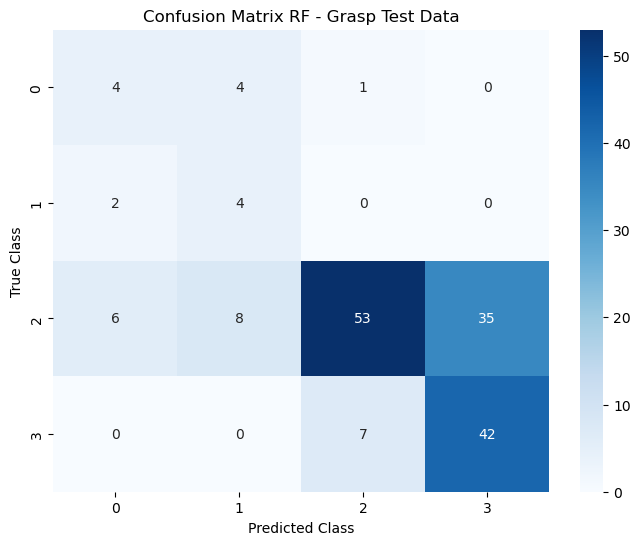

Applying best model to Grip dataset...


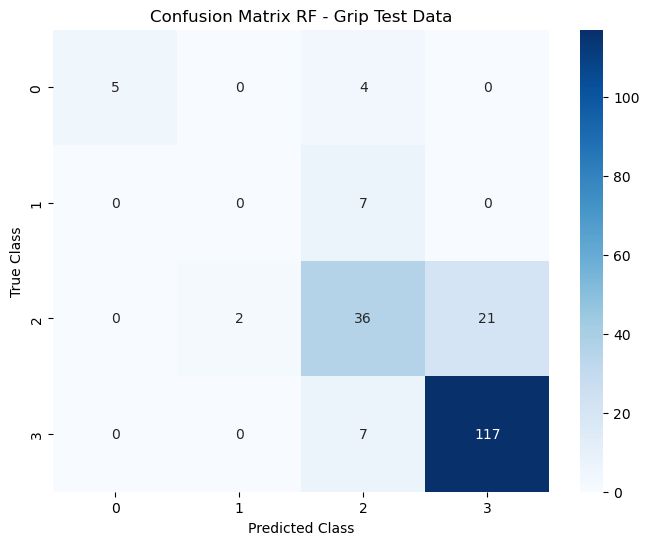

Applying best model to Pinch dataset...


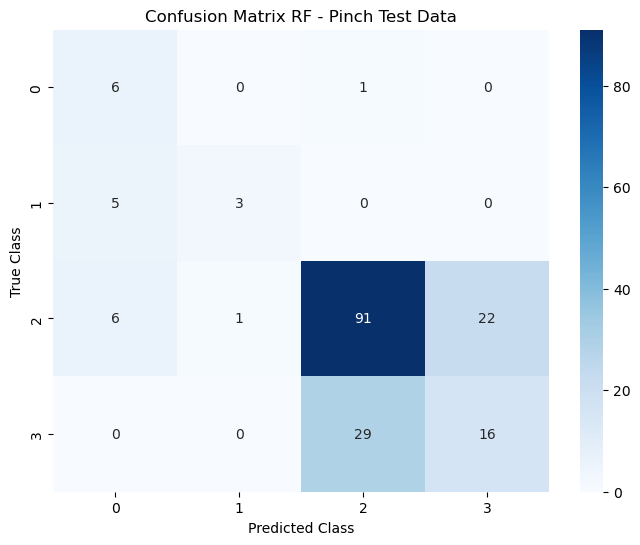

Applying best model to Gross dataset...


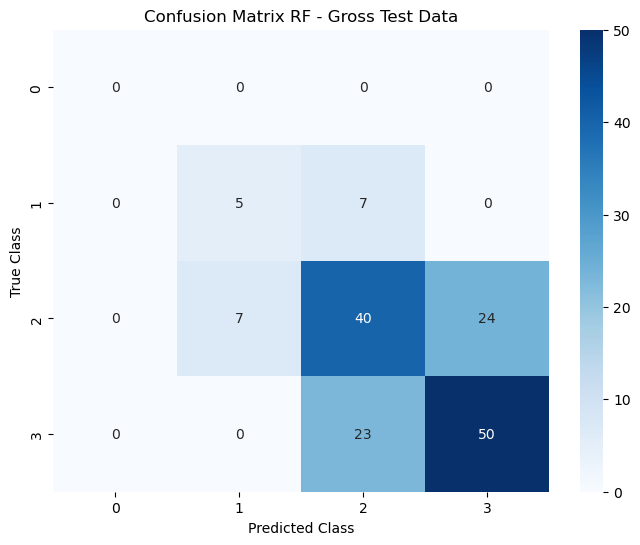

  Model  PCA Category Accuracy Weighted Accuracy Weighted F1 Score
0    RF  80%    Grasp     0.62              0.62              0.63
1    RF  80%     Grip     0.53              0.79              0.78
2    RF  80%    Pinch     0.59              0.64              0.64
3    RF  80%    Gross     0.55              0.61              0.61


In [54]:
# Define your datasets
datasets = {
    "Grasp": (X_train_grasp, y_train_grasp, X_test_grasp, y_test_grasp),
    "Grip": (X_train_grip, y_train_grip, X_test_grip, y_test_grip),
    "Pinch": (X_train_pinch, y_train_pinch, X_test_pinch, y_test_pinch),
    "Gross": (X_train_gross, y_train_gross, X_test_gross, y_test_gross)
}

# Define lr_best (assuming this is already computed)


# Apply the best model (e.g., "90%")
final_results, saved_models = apply_best_model_to_datasets(
    datasets=datasets,
    best=rf_best,
    best_key="80%",  # Specify the best PCA level key
    calc_metrics=calc_metrics,
    confusion_matrix_func=confusion_matrix_vis
)

# Display the results
print(final_results)


# Model Explainability and Interpretability 

In [56]:
model_grasp= saved_models["Grasp"]
model_grip= saved_models["Grip"]
model_pinch= saved_models["Pinch"]
model_gross= saved_models["Gross"]

In [57]:
import lime
import lime.lime_tabular

explainer_grasp= lime.lime_tabular.LimeTabularExplainer(X_train_grasp, feature_names=grasp.columns, class_names=[0, 1, 2, 3], discretize_continuous=True)
i = np.random.randint(0, X_test_grasp.shape[0])
exp_grasp = explainer_grasp.explain_instance(X_test_grasp[i], model_grasp.predict_proba, num_features=10, top_labels=1)
exp_grasp.show_in_notebook(show_table=True, show_all=False)

In [58]:
explainer_grip= lime.lime_tabular.LimeTabularExplainer(X_train_grip, feature_names=grip.columns, class_names=[0, 1, 2, 3], discretize_continuous=True)
i = np.random.randint(0, X_test_grip.shape[0])
exp_grip = explainer_grip.explain_instance(X_test_grip[i], model_grip.predict_proba, num_features=10, top_labels=1)
exp_grip.show_in_notebook(show_table=True, show_all=False)

In [59]:
explainer_pinch= lime.lime_tabular.LimeTabularExplainer(X_train_pinch, feature_names=pinch.columns, class_names=[0, 1, 2, 3], discretize_continuous=True)
i = np.random.randint(0, X_test_pinch.shape[0])
exp_pinch = explainer_pinch.explain_instance(X_test_pinch[i], model_pinch.predict_proba, num_features=10, top_labels=1)
exp_pinch.show_in_notebook(show_table=True, show_all=False)

In [60]:
explainer_gross= lime.lime_tabular.LimeTabularExplainer(X_train_gross, feature_names=gross.columns, class_names=[0, 1, 2, 3], discretize_continuous=True)
i = np.random.randint(0, X_test_gross.shape[0])
exp_gross = explainer_gross.explain_instance(X_test_gross[i], model_gross.predict_proba, num_features=10, top_labels=1)
exp_gross.show_in_notebook(show_table=True, show_all=False)